We use KneiborsClassifier and face_recognition to build a model. This model will be trained by known person pictures. We use some known pictures or unknown pictures to test the trained model. As second step, we will test picture from webcam

In [1]:
# jsp_kneighbors_face.ipynb
# Use face_recognition to identify normal face
import numpy as np
import os
import face_recognition as frg
from sklearn.neighbors import KNeighborsClassifier
import re
import math
import matplotlib.pyplot as plt

In [2]:
# We define a train function

def kntrain(X, y, neighbors, kn_alg):
    if neighbors is None:
        neighbors = int(math.sqrt(len(X)))
    klf1 = KNeighborsClassifier(algorithm=kn_alg, n_neighbors=neighbors, weights='distance')
    klf1.fit(X,y)
    return klf1            
    

In [3]:
# Create training matrix X, y

extension = ['jpg','png','bmp','jpeg']
X =[]
y =[]

for (root,dirs,files) in os.walk('knn_examples'):
    pattern = '^\w+/train/\w+'
    if re.match(pattern, root):
        print('root:',root)
        print('files:',files)
        label0 = root.split('/')[-1]
        for imgf in files:
            imgf = imgf.lower()
            if imgf.split('.')[1] in extension:
                imgpath = os.path.join(root, imgf)
                npimg = frg.load_image_file(imgpath, mode='RGB')
                f_location = frg.face_locations(npimg, model='hog')
                #print('imgpath:',imgpath)
                #print('label0:',label0)                
                if len(f_location) == 1:
                    f_encord = frg.face_encodings(npimg,known_face_locations=f_location)[0]

                    X.append(f_encord)
                    y.append(label0)
                else:
                    print('Incorrect face image!')    
            else:
                print('File $s has wrong format' % imgf)
  
klf = kntrain(X, y, neighbors=None, kn_alg='ball_tree')

root: knn_examples/train/obama
files: ['obama2.jpg', 'obama.jpg']
root: knn_examples/train/alex_lacamoire
files: ['img1.jpg']
root: knn_examples/train/kit_harington
files: ['john1.jpeg', 'john2.jpeg']
root: knn_examples/train/biden
files: ['biden.jpg', 'biden2.jpg']
root: knn_examples/train/rose_leslie
files: ['img2.jpg', 'img1.jpg']


In [4]:
# Create test image list
Xt=[]   #Test images encoding
ft=[]   #Test image file path
lt=[]   #Face location in image
for (root,dirs,files) in os.walk('knn_examples/test'):
    if (files!=""):
        for f1 in files:
            label1 = f1.split('.')[0]
            f1path = os.path.join(root,f1)
            f1img = frg.load_image_file(f1path, mode='RGB')
            f_locations = frg.face_locations(f1img, model='hog')
            f_encodings = frg.face_encodings(f1img, known_face_locations=f_locations)
            #print('f_encodings:',f_encodings)
            for i in range(len(f_encodings)):
                Xt.append(f_encodings[i])
                lt.append(f_locations[i])
                ft.append(f1path)
print(len(Xt))
print(len(lt))
print(ft)

8
8
['knn_examples/test/johnsnow_test1.jpg', 'knn_examples/test/kit_with_rose.jpg', 'knn_examples/test/kit_with_rose.jpg', 'knn_examples/test/obama_and_biden.jpg', 'knn_examples/test/obama_and_biden.jpg', 'knn_examples/test/obama_and_biden.jpg', 'knn_examples/test/alex_lacamoire1.jpg', 'knn_examples/test/obama1.jpg']


In [5]:
# this function only show face bounding box
from matplotlib import pyplot as plt
import cv2

def show_labels_on_image(img_path, location, label_index):
    img = cv2.imread(img_path)
    (top,right, bottom, left) = location
    color = (255, 255,0)
    thickness = 2
    img2 = cv2.rectangle(img, (top, left), (bottom, right), color, thickness)
    img2 = img2[:,:,::-1]
    plt.imshow(img2)

In [6]:
# This funcation can show the real image size inline, and draw label text
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

def show_labels_on_image2(img_path, location, label_index):
    pil_image = Image.open(img_path).convert("RGB")
    (top,right, bottom, left) = location
    name = y[label_index]     # get predicted name
    #name = name.encode("UTF-8")
    draw = ImageDraw.Draw(pil_image)
    draw.rectangle(((left, top), (right, bottom)), outline=(0, 0, 255))
    # Define font type and size. The font file is in my ubuntu 18.04. Font size is 14
    font_file = '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf'
    font = ImageFont.truetype(font_file, 14)
    text_w,text_h = font.getsize(name)
    #text_width, text_height = draw.textsize(name)
    
    draw.text((left + 5, bottom + text_h), name, font=font, fill=(255, 255, 255, 255))

    #Below will pop up a image window
    #pil_image.show()
    #Below shows image inline
    display(pil_image)

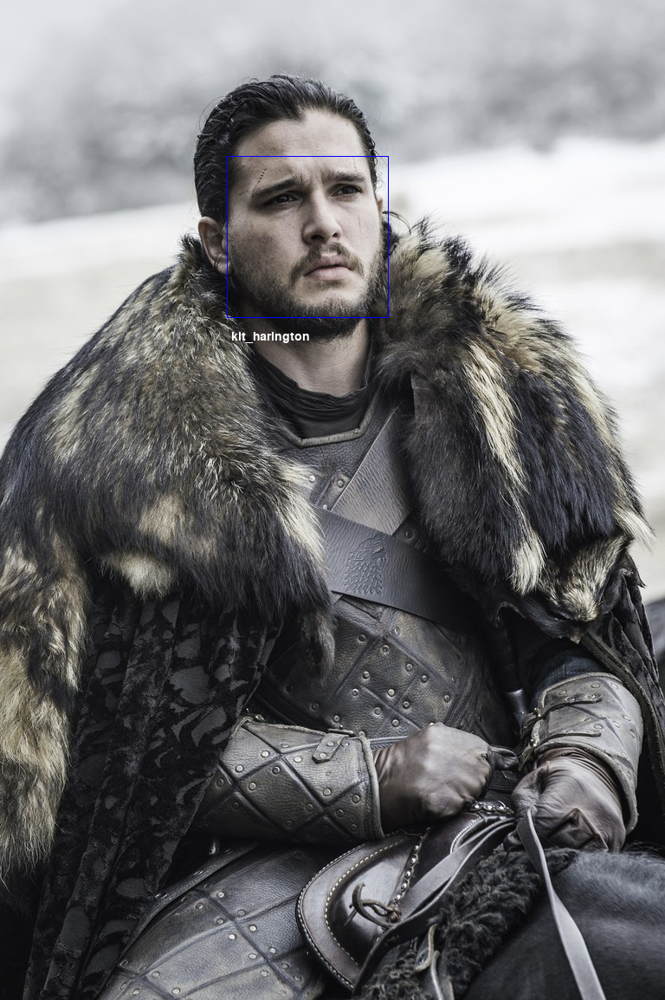

Test image: knn_examples/test/johnsnow_test1.jpg


In [7]:
# Test one image on trained knn model
dist_threshold = 0.6
xt = Xt[0].reshape(1,-1)
closest_distance = klf.kneighbors(xt, n_neighbors=1, return_distance=True)
if closest_distance[0][0][0] <= dist_threshold :
    # Below closest_distance[1][0][0] is label (y) indices
    show_labels_on_image2(ft[0], lt[0], closest_distance[1][0][0])
    
print('Test image:', ft[0])

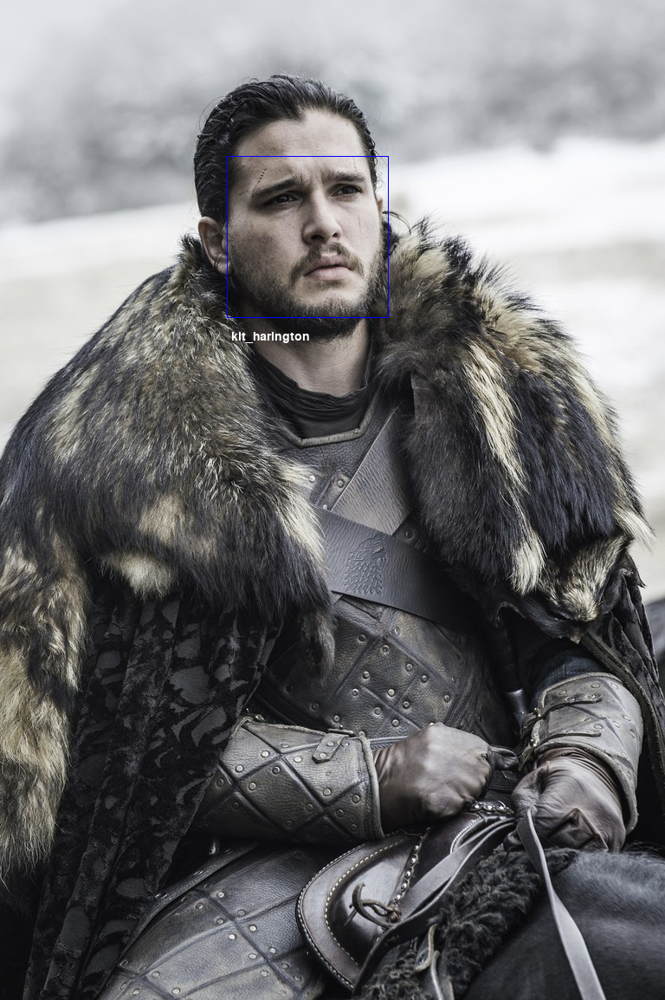

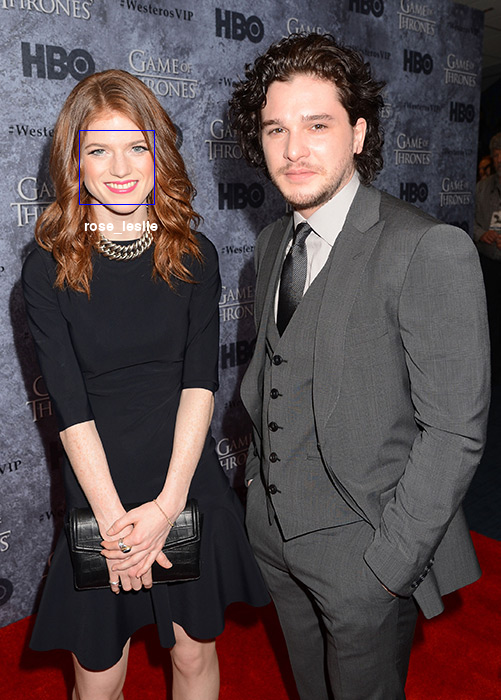

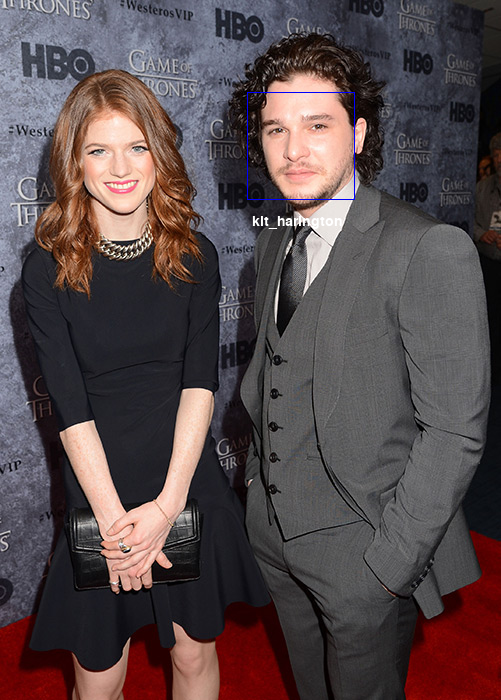

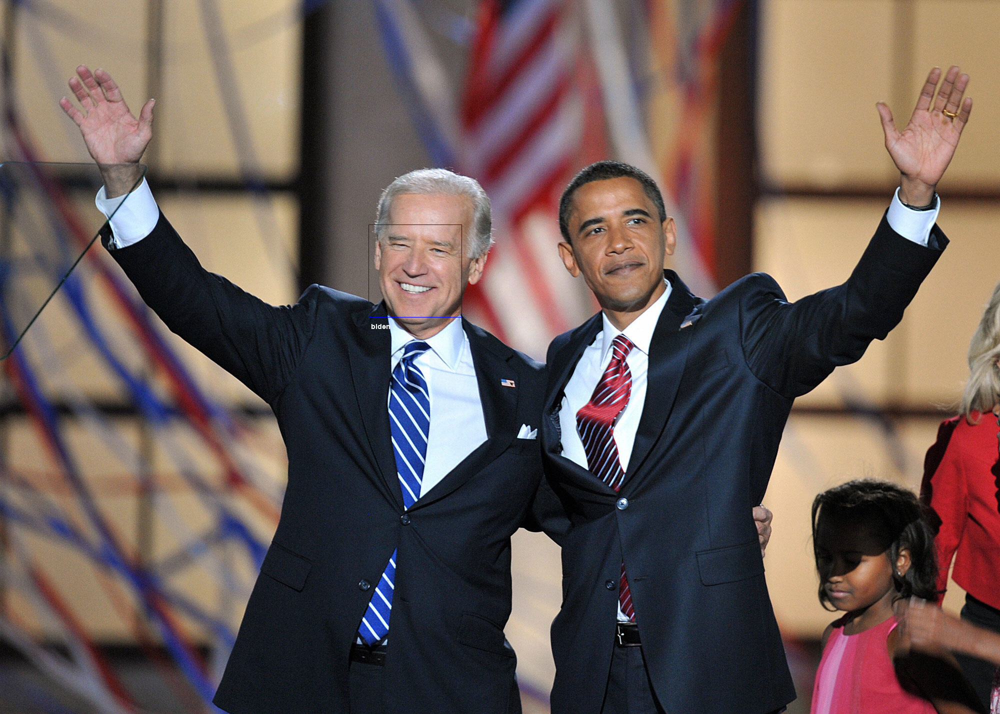

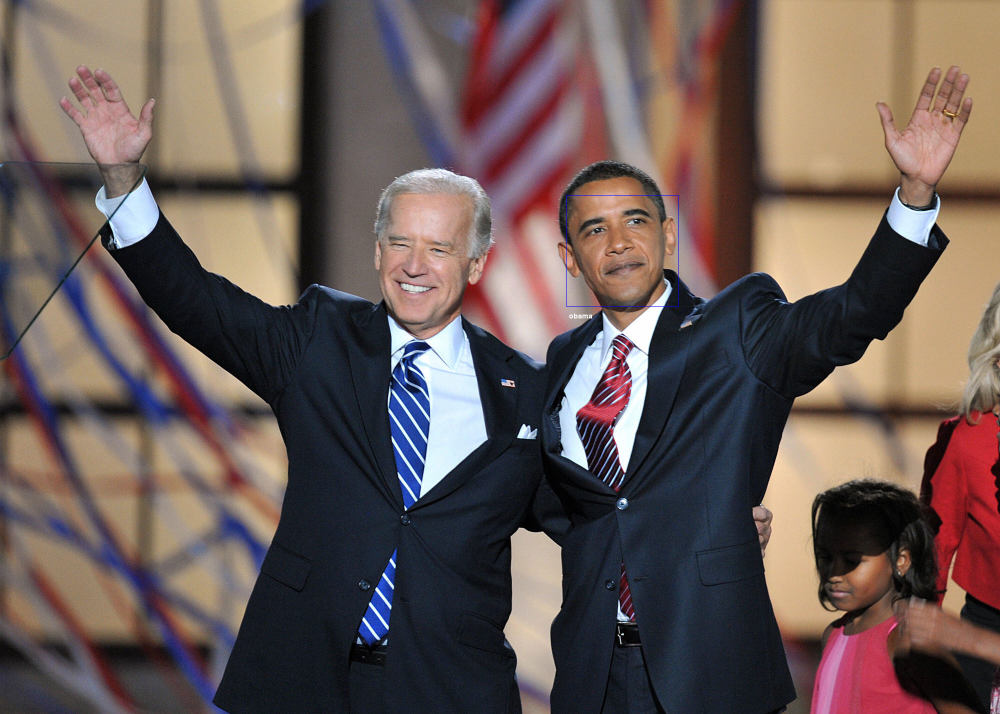

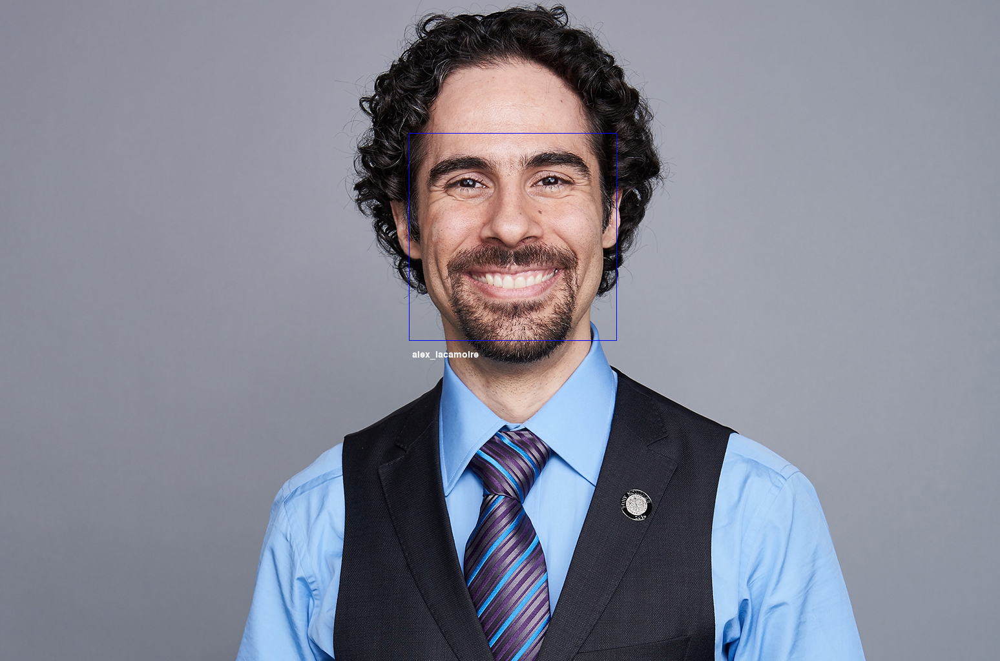

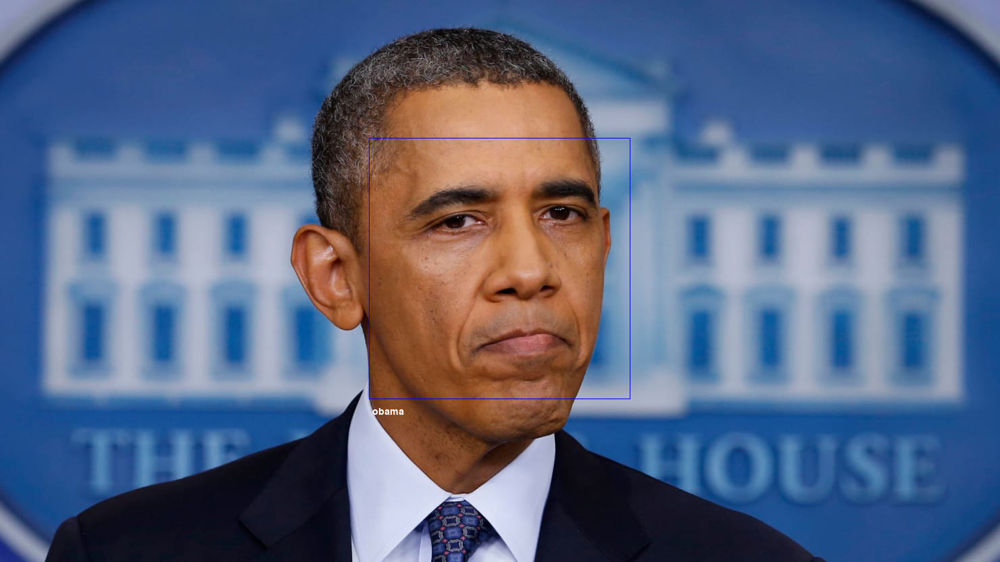

Test image: knn_examples/test/obama1.jpg


In [8]:
# Test all images on trained knn model
for i in range(len(Xt)):
    xt = Xt[i].reshape(1,-1)
    closest_distance = klf.kneighbors(xt, n_neighbors=1, return_distance=True)
    if closest_distance[0][0][0] <= dist_threshold:
        # Below closest_distance[1][0][0] is label (y) indices
        show_labels_on_image2(ft[i], lt[i], closest_distance[1][0][0])
    
print('Test image:', ft[i])
